<a href="https://colab.research.google.com/github/yexf308/PracticalML/blob/main/Week_2_Data_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Matplotlib forms basis for visualization in Python
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import seaborn as sns
sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

This notebook is referred to Yury Kashnitsky's work. 

# Data Visualization
To start with, visual exploration of data is the first thing one tends to do when dealing with a new task. We do preliminary checks and analysis using graphics and tables to summarize the data and leave out the less important details. It is much more convenient for us, humans, to grasp the main points this way than by reading many lines of raw data. It is amazing how much insight can be gained from seemingly simple charts created with available visualization tools.

Next, when we analyze the performance of a model or report results, we also often use charts and images. Sometimes, for interpreting a complex model, we need to project high-dimensional spaces onto more visually intelligible 2D or 3D figures.

All in all, visualization is a relatively fast way to learn something new about your data. Thus, it is vital to learn its most useful techniques and make them part of your everyday ML toolbox.

We will use the same dataset as the week 1 lecture. 

In [2]:
!wget https://raw.githubusercontent.com/yexf308/PracticalML/main/data/telecom_churn.csv?raw=true -O telecom_churn

--2023-05-19 19:36:38--  https://raw.githubusercontent.com/yexf308/PracticalML/main/data/telecom_churn.csv?raw=true
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 279997 (273K) [text/plain]
Saving to: ‘telecom_churn’

telecom_churn       100%[===================>] 273.43K  --.-KB/s    in 0.02s   

2023-05-19 19:36:38 (11.8 MB/s) - ‘telecom_churn’ saved [279997/279997]



In [3]:
telecom_churn = pd.read_csv('telecom_churn')
# Exploratory Data Analysis
telecom_churn.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


## Univariate visualization
### Numerical Feature
1. The easiest way to take a look at the distribution of a numerical variable is to plot its **histogram** using the DataFrame’s method ```hist()```.


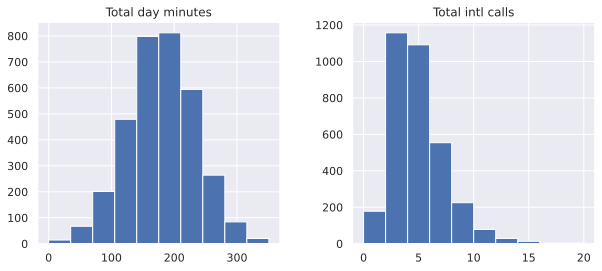

In [4]:
features = ["Total day minutes", "Total intl calls"]
telecom_churn[features].hist(figsize=(10, 4));

In the above plot, we see that the variable Total day minutes is normally distributed, while Total intl calls is prominently skewed right (its tail is longer on the right).

2. There is also another way to grasp the distribution: density plots or, more formally, **Kernel Density Plots**. They can be considered a smoothed version of the histogram. Their main advantage over the latter is that they do not depend on the size of the bins.

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

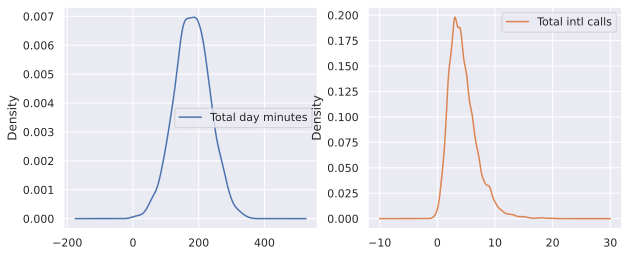

In [5]:
telecom_churn[features].plot(
    kind="density", subplots=True, layout=(1, 2), sharex=False, figsize=(10, 4)
)

<Axes: xlabel='Total day minutes', ylabel='Count'>

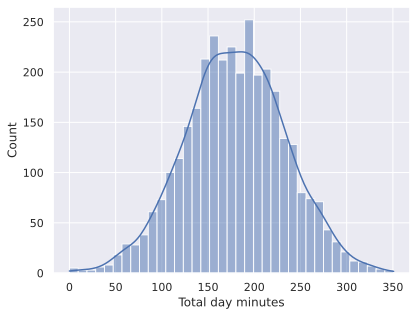

In [6]:
# It is also possible to plot a distribution of observations with seaborn’s histplot(). 
# For example, let’s look at the distribution of Total day minutes. 
sns.histplot(telecom_churn["Total day minutes"], kde=True)

3. Another useful type of visualization is a **box plot**.

<Axes: xlabel='Total intl calls'>

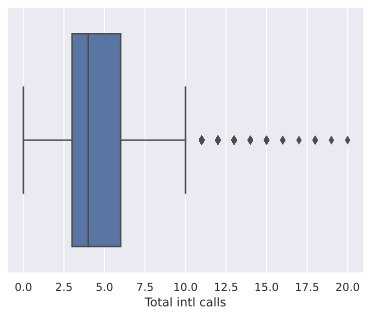

In [7]:
# box plot
sns.boxplot(x="Total intl calls", data=telecom_churn)


To interpret a box plot. Its components are a box, the so-called whiskers, and a number of individual points (outliers).

- The box by itself illustrates the interquartile spread of the distribution; its length is determined by the $25\% \, (\text{Q1})$ and $75\% \, (\text{Q3})$ percentiles. The vertical line inside the box marks the median ($50\%$) of the distribution.

- The whiskers are the lines extending from the box. They represent the entire scatter of data points, specifically the points that fall within the interval $(\text{Q1} - 1.5 \cdot \text{IQR}, \text{Q3} + 1.5 \cdot \text{IQR})$, where $\text{IQR} = \text{Q3} - \text{Q1}$ is the [interquartile range](https://en.wikipedia.org/wiki/Interquartile_range).

- Outliers that fall outside of the range bounded by the whiskers are plotted individually as black points along the central axis.

We can see that a large number of international calls is quite rare in our data.

4. The last type of distribution plots that we will consider is a **violin plot**. This is a violin plot with the kernel density estimate on both sides.

The difference between the box and violin plots is that the former illustrates certain statistics concerning individual examples in a dataset while the violin plot concentrates more on the smoothed distribution as a whole.

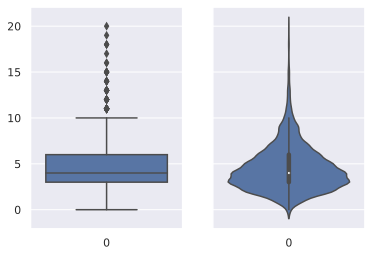

In [8]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(6, 4))
sns.boxplot(data=telecom_churn["Total intl calls"], ax=axes[0])
sns.violinplot(data=telecom_churn["Total intl calls"], ax=axes[1]);

5. In addition to graphical tools, in order to get the exact numerical statistics of the distribution, we can use the method describe() of a DataFrame:

In [9]:
telecom_churn[features].describe()


,Total day minutes,Total intl calls
count,3333.000000,3333.000000
mean,179.775098,4.479448
std,54.467389,2.461214
min,0.000000,0.000000
25%,143.700000,3.000000
50%,179.400000,4.000000
75%,216.400000,6.000000
max,350.800000,20.000000


### Categorical and binary features
Categorical features take on a fixed number of values. Each of these values assigns an observation to a corresponding group, known as a category, which reflects some qualitative property of this example. Binary variables are an important special case of categorical variables when the number of possible values is exactly 2. 

1. **Frequency table**
Let’s check the class balance in our dataset by looking at the distribution of the target variable: the churn rate. First, we will get a frequency table, which shows how frequent each value of the categorical variable is. For this, we will use the value_counts() method:

In [10]:
telecom_churn["Churn"].value_counts()

False    2850
True      483
Name: Churn, dtype: int64

By default, the entries in the output are sorted from the most to the least frequently-occurring values.

In our case, the data is not balanced; that is, our two target classes, loyal and disloyal customers, are not represented equally in the dataset. Only a small part of the clients canceled their subscription to the telecom service. As we will see in the following articles, this fact may imply some restrictions on measuring the classification performance, and, in the future, we may want to additionally penalize our model errors in predicting the minority “Churn” class.

2. **Bar plot**
The bar plot is a graphical representation of the frequency table. The easiest way to create it is to use the seaborn’s function ```countplot()```. There is another function in seaborn that is somewhat confusingly called ```barplot()``` and is mostly used for representation of some basic statistics of a numerical variable grouped by a categorical feature.

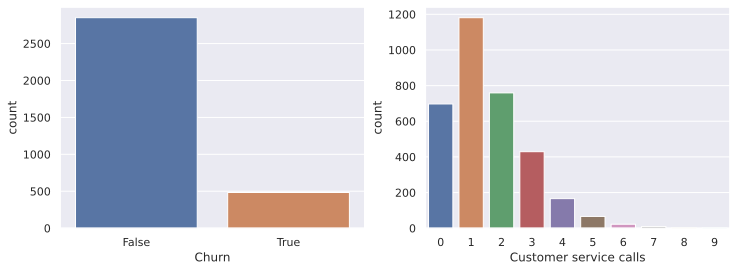

In [11]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

sns.countplot(x="Churn", data=telecom_churn, ax=axes[0])
sns.countplot(x="Customer service calls", data=telecom_churn, ax=axes[1]);

The left chart above vividly illustrates the imbalance in our target variable. The bar plot for Customer service calls on the right gives a hint that the majority of customers resolve their problems in maximum 2–3 calls. But, as we want to be able to predict the minority class, we may be more interested in how the fewer dissatisfied customers behave. It may well be that the tail of that bar plot contains most of our churn. 

**Difference between histogram and bar plot**

1. Histograms are best suited for looking at the distribution of numerical variables while bar plots are used for categorical features.

2. The values on the X-axis in the histogram are numerical; a bar plot can have any type of values on the X-axis: numbers, strings, booleans.

3. The histogram’s X-axis is a Cartesian coordinate axis along which values cannot be changed; the ordering of the bars is not predefined. Still, it is useful to note that the bars are often sorted by height, that is, the frequency of the values. Also, when we consider ordinal variables (like Customer service calls in our data), the bars are usually ordered by variable value.

## Multivariate visualization
Multivariate plots allow us to see relationships between two and more different variables, all in one figure. 
### Quantitative vs. Quantitative
1. **Correlation matrix**: correlations among the numerical variables in our dataset. This information is important to know as there are Machine Learning algorithms that do not handle highly correlated input variables well.

First, we will use the method ```corr()``` on a DataFrame that calculates the correlation between each pair of features. Then, we pass the resulting correlation matrix to ```heatmap()``` from seaborn, which renders a color-coded matrix for the provided values:


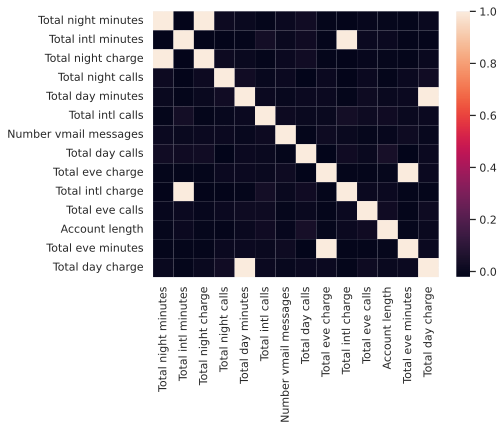

In [12]:
# Drop non-numerical variables
numerical = list(
    set(telecom_churn.columns)
    - set(
        [
            "State",
            "International plan",
            "Voice mail plan",
            "Area code",
            "Churn",
            "Customer service calls",
        ]
    )
)

# Calculate and plot
corr_matrix = telecom_churn[numerical].corr()
sns.heatmap(corr_matrix);

From the colored correlation matrix generated above, we can see that there are 4 variables such as Total day charge that have been calculated directly from the number of minutes spent on phone calls (Total day minutes). These are called dependent variables and can therefore be left out since they do not contribute any additional information. Let’s get rid of them:



In [13]:
numerical = list(
    set(numerical)
    - set(
        [
            "Total day charge",
            "Total eve charge",
            "Total night charge",
            "Total intl charge",
        ]
    )
)

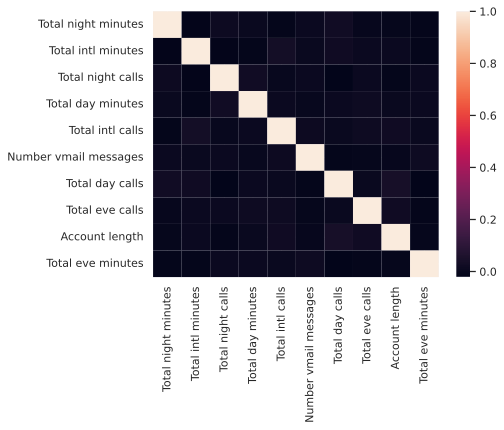

In [14]:
corr_matrix = telecom_churn[numerical].corr()
sns.heatmap(corr_matrix);

2. **scatter plot** The scatter plot displays values of two numerical variables as Cartesian coordinates in 2D space. Scatter plots in 3D are also possible.

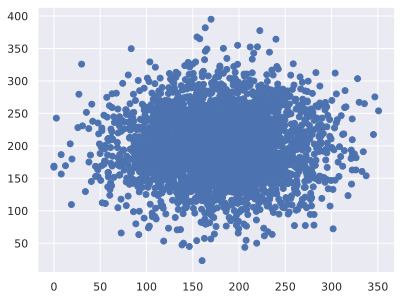

In [15]:
plt.scatter(telecom_churn["Total day minutes"], telecom_churn["Total night minutes"]);


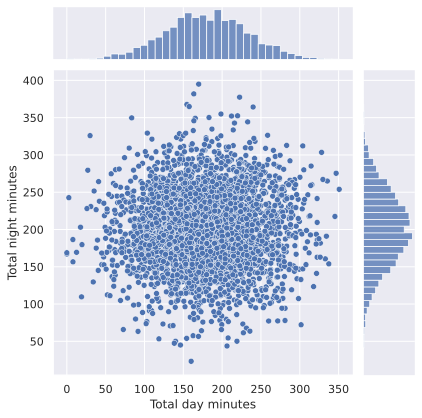

In [16]:
# create a scatter plot with the seaborn
sns.jointplot(x="Total day minutes", y="Total night minutes", data=telecom_churn, kind="scatter");


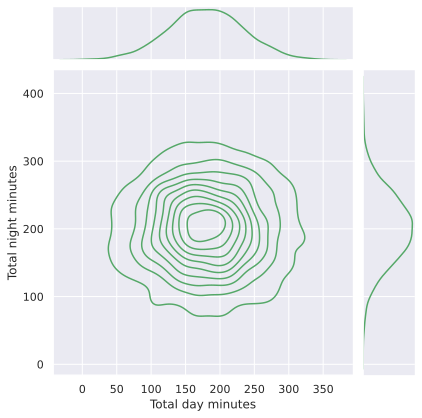

In [17]:
#  a bivariate version of the Kernel Density Plot with jointplot
sns.jointplot(
    x="Total day minutes", y="Total night minutes", data=telecom_churn, kind="kde", color="g"
);


We get an uninteresting picture of two normally distributed variables. Also, it seems that these features are uncorrelated because the ellipse-like shape is aligned with the axes.

**Scatterplot matrix**: In some cases, we may want to plot a scatterplot matrix such as the one shown below. Its diagonal contains the distributions of the corresponding variables, and the scatter plots for each pair of variables fill the rest of the matrix.

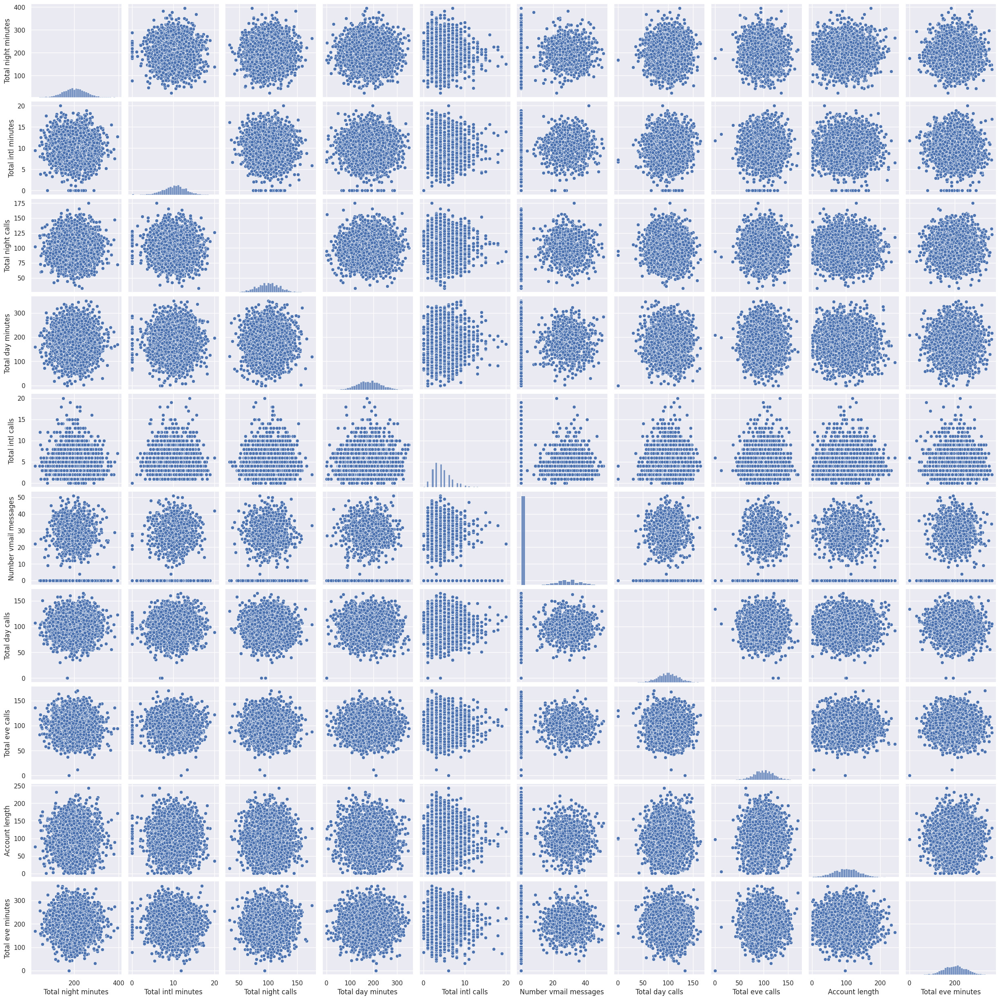

In [18]:
%config InlineBackend.figure_format = 'png'
sns.pairplot(telecom_churn[numerical]);

In [19]:
%config InlineBackend.figure_format = 'svg'


### Quantitative vs. Categorical
We will try to gain new insights for churn prediction from the interactions between the numerical and categorical features. 

**Scatter Plot**
Points can be color or size coded so that the values of a third categorical variable are also presented in the same figure.
This can be done by a new function called ```lmplot()``` and use the parameter hue to indicate our categorical feature of interest.

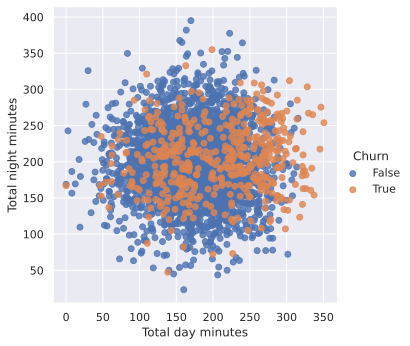

In [20]:
sns.lmplot(
    x="Total day minutes", y="Total night minutes", data=telecom_churn, hue="Churn", fit_reg=False
);

It seems that our small proportion of disloyal customers lean towards the top-right corner; that is, such customers tend to spend more time on the phone during both day and night. But this is not absolutely clear, and we won’t make any definitive conclusions from this chart.





---


**box plot**:  visualize the distribution statistics of the numerical variables in two disjoint groups. 

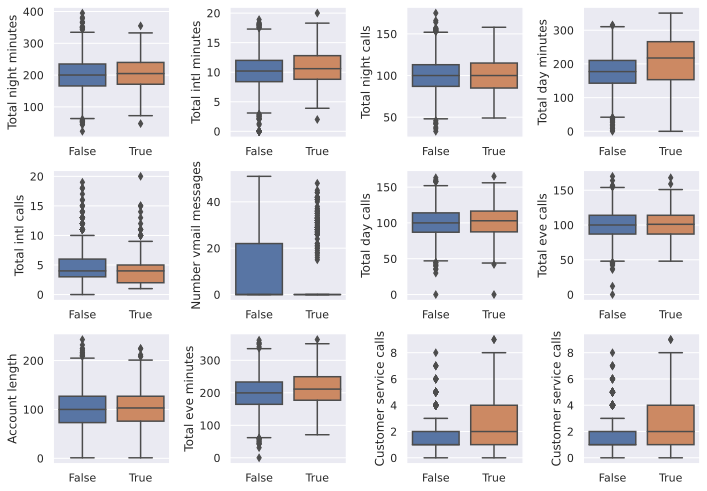

In [22]:
numerical.append("Customer service calls")

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 7))
for idx, feat in enumerate(numerical):
    ax = axes[int(idx / 4), idx % 4]
    sns.boxplot(x="Churn", y=feat, data=telecom_churn, ax=ax)
    ax.set_xlabel("")
    ax.set_ylabel(feat)
fig.tight_layout();

From this chart, we can see that the greatest discrepancy in distribution between the two groups is for three variables: Total day minutes, Customer service calls, and Number vmail messages. We will learn how to determine feature importance in classification using various different models. 



---


Let’s look at the distribution of day minutes spoken for the loyal and disloyal customers separately. We will create **box and violin plots** for Total day minutes grouped by the target variable.



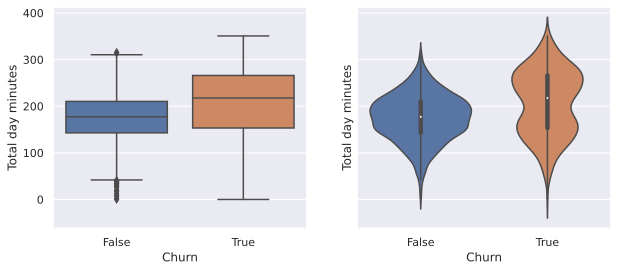

In [24]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))

sns.boxplot(x="Churn", y="Total day minutes", data=telecom_churn, ax=axes[0])
sns.violinplot(x="Churn", y="Total day minutes", data=telecom_churn, ax=axes[1]);



---


**An interesting observation:** on average, customers that discontinue their contracts are more active users of communication services. Perhaps they are unhappy with the tariffs, so a possible measure to prevent churn could be a reduction in call rates. The company will need to undertake additional economic analysis to find out whether such measures would be beneficial.

When we want to analyze a quantitative variable in two categorical dimensions at once, there is a suitable function for this in the seaborn library called **catplot**. For example, let’s visualize the interaction between Total day minutes and two categorical variables in the same plot:

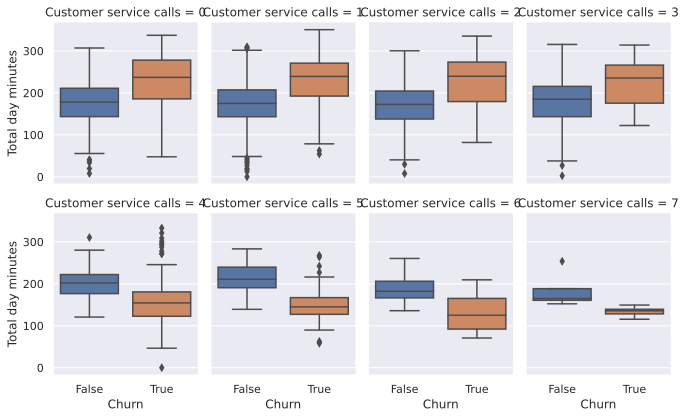

In [26]:
sns.catplot(
    x="Churn",
    y="Total day minutes",
    col="Customer service calls",
    data=telecom_churn[telecom_churn["Customer service calls"] < 8],
    kind="box",
    col_wrap=4,
    height=3,
    aspect=0.8,
);

From this, we could conclude that, starting with 4 calls, Total day minutes may no longer be the main factor for customer churn. Perhaps, in addition to our previous guess about the tariffs, there are customers that are dissatisfied with the service due to other problems, which might lead to fewer number of day minutes spent on calls.

### Categorical vs. Categorical

the variable Customer service calls has few unique values and, thus, can be considered either numerical or ordinal. We have already seen its distribution with a **countplot**. Now, we are interested in the relationship between this ordinal feature and the target variable Churn.

Let’s look at the distribution of the number of calls to customer service, again using a count plot. This time, let’s also pass the parameter `hue=churn` that adds a categorical dimension to the plot. Like we discussed before, the churn rate increases significantly after 4 or more calls to customer service.

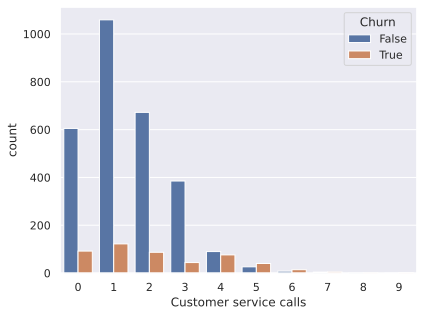

In [27]:
sns.countplot(x="Customer service calls", hue="Churn", data=telecom_churn);


Let’s look at the relationship between Churn and the binary features, International plan and Voice mail plan.

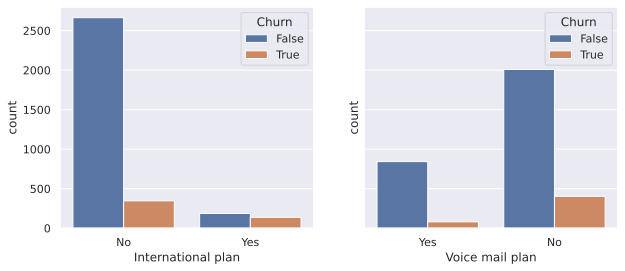

In [29]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))

sns.countplot(x="International plan", hue="Churn", data=telecom_churn, ax=axes[0])
sns.countplot(x="Voice mail plan", hue="Churn", data=telecom_churn, ax=axes[1]);

**An observation**: when International Plan is enabled, the churn rate is much higher; the usage of the international plan by the customer is a strong feature. We do not observe the same effect with Voice mail plan.



---

In addition to using graphical means for categorical analysis, there is a traditional tool from statistics: a **contingency table**, also called a cross tabulation. It shows a multivariate frequency distribution of categorical variables in tabular form. In particular, it allows us to see the distribution of one variable conditional on the other by looking along a column or row.

Let’s try to see how Churn is related to the categorical variable State by creating a cross tabulation:


In [30]:
pd.crosstab(telecom_churn["State"], telecom_churn["Churn"]).T


State,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Churn,,,,,,,,,,,,,,,,,,,,,
False,49,72,44,60,25,57,62,49,52,55,...,52,48,54,62,72,65,52,71,96,68
True,3,8,11,4,9,9,12,5,9,8,...,8,5,18,10,5,8,14,7,10,9


In the case of State, the number of distinct values is rather high: 51. We see that there are only a few data points available for each individual state – only 3 to 17 customers in each state abandoned the operator. Let’s ignore that for a second and calculate the churn rate for each state, sorting it from high to low:

In [31]:
telecom_churn.groupby(["State"])["Churn"].agg([np.mean]).sort_values(by="mean", ascending=False).T


State,NJ,CA,TX,MD,SC,MI,MS,NV,WA,ME,...,RI,WI,IL,NE,LA,IA,VA,AZ,AK,HI
mean,0.264706,0.264706,0.25,0.242857,0.233333,0.219178,0.215385,0.212121,0.212121,0.209677,...,0.092308,0.089744,0.086207,0.081967,0.078431,0.068182,0.064935,0.0625,0.057692,0.056604


At first glance, it seems that the churn rate in New Jersey and California are above 25% and less than 6% for Hawaii and Alaska. However, these conclusions are based on too few examples, and our observation could be a mere property of our particular dataset.

## Data Visualizations

Most real-world datasets have many features, sometimes, many thousands of them. Each of them can be considered as a dimension in the space of data points. Consequently, more often than not, we deal with high-dimensional datasets, where entire visualization is quite hard.

To look at a dataset as a whole, we need to decrease the number of dimensions used in visualization without losing much information about the data. This task is called dimensionality reduction and is an example of an unsupervised learning problem because we need to derive new, low-dimensional features from the data itself, without any supervised input.

One of the well-known dimensionality reduction methods is Principal Component Analysis (PCA), which we will study later in this course. Its limitation is that it is a linear algorithm that implies certain restrictions on the data.

There are also many non-linear methods, collectively called Manifold Learning. One of the best-known of them is t-SNE and another one is UMAP.

In [32]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

We will leave out the State and Churn features and convert the values “Yes”/”No” of the binary features into numerical values using `pandas.Series.map()`:

In [33]:
X = telecom_churn.drop(["Churn", "State"], axis=1)
X["International plan"] = X["International plan"].map({"Yes": 1, "No": 0})
X["Voice mail plan"] = X["Voice mail plan"].map({"Yes": 1, "No": 0})

In [34]:
X

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,415,0,1,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2
3329,68,415,0,0,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3
3330,28,510,0,0,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2
3331,184,510,1,0,0,213.8,105,36.35,159.6,84,13.57,139.2,137,6.26,5.0,10,1.35,2


We also need to normalize the data. For this, we will subtract the mean from each variable and divide it by its standard deviation. All of this can be done with `StandardScaler`.

In [35]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [36]:
%%time
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(X_scaled)

CPU times: user 55.7 s, sys: 255 ms, total: 55.9 s
Wall time: 37.1 s


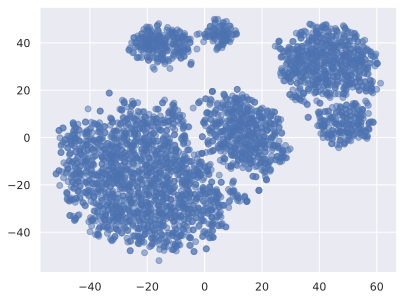

In [37]:
# build a t-SNE representation
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5);


Let’s color this t-SNE representation according to the churn (blue for loyal customers, and orange for those who churned).

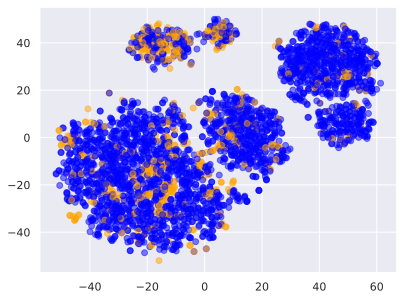

In [39]:
plt.scatter(
    tsne_repr[:, 0],
    tsne_repr[:, 1],
    c=telecom_churn["Churn"].map({False: "blue", True: "orange"}),
    alpha=0.5,
);

We can see that customers who churned are concentrated in a few areas of the lower dimensional feature space.

To better understand the picture, we can also color it with the remaining binary features: International Plan and Voicemail. Orange dots here indicate instances that are positive for the corresponding binary feature.



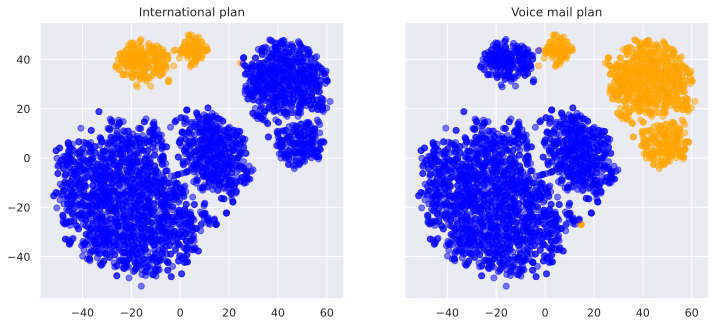

In [40]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

for i, name in enumerate(["International plan", "Voice mail plan"]):
    axes[i].scatter(
        tsne_repr[:, 0],
        tsne_repr[:, 1],
        c=telecom_churn[name].map({"Yes": "orange", "No": "blue"}),
        alpha=0.5,
    )
    axes[i].set_title(name);

Now it is clear that, for example, many dissatisfied customers who canceled their subscription are crowded together in one cluster representing the people with the international plan but no voice mail.

Let's try UMAP.

In [42]:
!pip install umap-learn
import umap


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 40.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=a22f3562ffd1e90d0c70abbe3cc1e71c513990c76730c4d987be1a91f804ec0b
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55622 sha256=302568f55578d54bcaf2db914bbd569ec3b373b14276ec9843039538458da99c
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [43]:
reducer = umap.UMAP()
imap_repr = reducer.fit_transform(X_scaled)

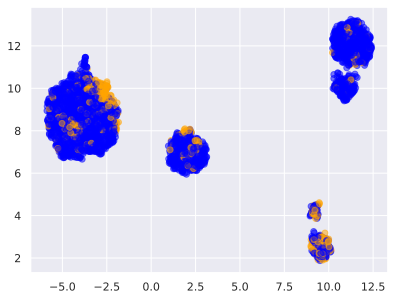

In [44]:
plt.scatter(
    imap_repr[:, 0],
    imap_repr[:, 1],
    c=telecom_churn["Churn"].map({False: "blue", True: "orange"}),
    alpha=0.5,
);

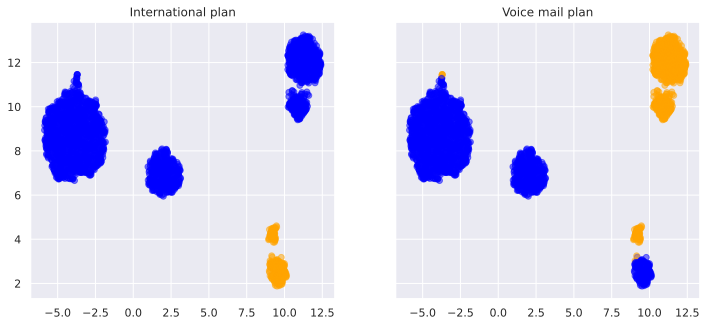

In [45]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

for i, name in enumerate(["International plan", "Voice mail plan"]):
    axes[i].scatter(
        imap_repr[:, 0],
        imap_repr[:, 1],
        c=telecom_churn[name].map({"Yes": "orange", "No": "blue"}),
        alpha=0.5,
    )
    axes[i].set_title(name);